Lorena Ciutacu | SPICED Academy - Data Science Bootcamp | Stochastic Sage

## Project 01: Animated scatterplot inspired by Hans Rosling

### Task: Plot the life expectancy an fertility for each country throughout the years.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
import imageio
import os

## Importing the data

In [2]:
fertility = pd.read_csv('/home/lorena/Documents/bootcamp/W1/gapminder_total_fertility.csv', index_col=0)
fertility.head()

,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Total fertility rate,,,,,,,,,,,,,,,,,,,,,
Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Afghanistan,7.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00,...,6.70,6.46,6.20,5.93,5.66,5.40,5.14,4.90,4.68,4.47
Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Albania,4.60,4.60,4.60,4.60,4.60,4.60,4.60,4.60,4.60,4.60,...,1.85,1.80,1.76,1.74,1.74,1.75,1.76,1.77,1.78,1.78
Algeria,6.99,6.99,6.99,6.99,6.99,6.99,6.99,6.99,6.99,6.99,...,2.58,2.66,2.73,2.78,2.82,2.83,2.82,2.80,2.76,2.71


In [3]:
expectancy = pd.read_excel('/home/lorena/Documents/bootcamp/W1/gapminder_lifeexpectancy.xlsx', index_col=0)
expectancy.head()

,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Life expectancy,,,,,,,,,,,,,,,,,,,,,
Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Afghanistan,28.21,28.20,28.19,28.18,28.17,28.16,28.15,28.14,28.13,28.12,...,52.4,52.8,53.3,53.6,54.0,54.4,54.8,54.9,53.8,52.72
Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Albania,35.40,35.40,35.40,35.40,35.40,35.40,35.40,35.40,35.40,35.40,...,76.6,76.8,77.0,77.2,77.4,77.5,77.7,77.9,78.0,78.10
Algeria,28.82,28.82,28.82,28.82,28.82,28.82,28.82,28.82,28.82,28.82,...,75.3,75.5,75.7,76.0,76.1,76.2,76.3,76.3,76.4,76.50


In [4]:
expectancy.index.name = 'country'
expectancy.index

Index([&#39;Abkhazia&#39;, &#39;Afghanistan&#39;, &#39;Akrotiri and Dhekelia&#39;, &#39;Albania&#39;,
       &#39;Algeria&#39;, &#39;American Samoa&#39;, &#39;Andorra&#39;, &#39;Angola&#39;, &#39;Anguilla&#39;,
       &#39;Antigua and Barbuda&#39;,
       ...
       &#39;Vietnam&#39;, &#39;Virgin Islands (U.S.)&#39;, &#39;North Yemen (former)&#39;,
       &#39;South Yemen (former)&#39;, &#39;Yemen&#39;, &#39;Yugoslavia&#39;, &#39;Zambia&#39;, &#39;Zimbabwe&#39;,
       &#39;Åland&#39;, &#39;South Sudan&#39;],
      dtype=&#39;object&#39;, name=&#39;country&#39;, length=260)

In [5]:
expectancy = expectancy.reset_index()
expectancy.head()

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,28.21,28.20,28.19,28.18,28.17,28.16,28.15,28.14,28.13,...,52.4,52.8,53.3,53.6,54.0,54.4,54.8,54.9,53.8,52.72
2,Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,35.40,35.40,35.40,35.40,35.40,35.40,35.40,35.40,35.40,...,76.6,76.8,77.0,77.2,77.4,77.5,77.7,77.9,78.0,78.10
4,Algeria,28.82,28.82,28.82,28.82,28.82,28.82,28.82,28.82,28.82,...,75.3,75.5,75.7,76.0,76.1,76.2,76.3,76.3,76.4,76.50


In [6]:
expectancy = expectancy.melt(id_vars='country', var_name='year', value_name='life_expectancy')
expectancy.head()

,country,year,life_expectancy
0,Abkhazia,1800,NaN
1,Afghanistan,1800,28.21
2,Akrotiri and Dhekelia,1800,NaN
3,Albania,1800,35.40
4,Algeria,1800,28.82


In [7]:
# check the shape of each dataframe

fertility.shape, expectancy.shape

((260, 216), (56420, 3))

In [8]:
# check the columns

print(fertility.columns, "\n\n", expectancy.columns)

Index([&#39;1800&#39;, &#39;1801&#39;, &#39;1802&#39;, &#39;1803&#39;, &#39;1804&#39;, &#39;1805&#39;, &#39;1806&#39;, &#39;1807&#39;, &#39;1808&#39;,
       &#39;1809&#39;,
       ...
       &#39;2006&#39;, &#39;2007&#39;, &#39;2008&#39;, &#39;2009&#39;, &#39;2010&#39;, &#39;2011&#39;, &#39;2012&#39;, &#39;2013&#39;, &#39;2014&#39;,
       &#39;2015&#39;],
      dtype=&#39;object&#39;, length=216) 

 Index([&#39;country&#39;, &#39;year&#39;, &#39;life_expectancy&#39;], dtype=&#39;object&#39;)


In [9]:
fertility.index

Index([&#39;Abkhazia&#39;, &#39;Afghanistan&#39;, &#39;Akrotiri and Dhekelia&#39;, &#39;Albania&#39;,
       &#39;Algeria&#39;, &#39;American Samoa&#39;, &#39;Andorra&#39;, &#39;Angola&#39;, &#39;Anguilla&#39;,
       &#39;Antigua and Barbuda&#39;,
       ...
       &#39;Vietnam&#39;, &#39;Virgin Islands (U.S.)&#39;, &#39;North Yemen (former)&#39;,
       &#39;South Yemen (former)&#39;, &#39;Yemen&#39;, &#39;Yugoslavia&#39;, &#39;Zambia&#39;, &#39;Zimbabwe&#39;,
       &#39;Åland&#39;, &#39;Åland&#39;],
      dtype=&#39;object&#39;, name=&#39;Total fertility rate&#39;, length=260)

In [10]:
fertility.index.name = 'country'
fertility.index

Index([&#39;Abkhazia&#39;, &#39;Afghanistan&#39;, &#39;Akrotiri and Dhekelia&#39;, &#39;Albania&#39;,
       &#39;Algeria&#39;, &#39;American Samoa&#39;, &#39;Andorra&#39;, &#39;Angola&#39;, &#39;Anguilla&#39;,
       &#39;Antigua and Barbuda&#39;,
       ...
       &#39;Vietnam&#39;, &#39;Virgin Islands (U.S.)&#39;, &#39;North Yemen (former)&#39;,
       &#39;South Yemen (former)&#39;, &#39;Yemen&#39;, &#39;Yugoslavia&#39;, &#39;Zambia&#39;, &#39;Zimbabwe&#39;,
       &#39;Åland&#39;, &#39;Åland&#39;],
      dtype=&#39;object&#39;, name=&#39;country&#39;, length=260)

In [11]:
# convert into long format

fertility = fertility.reset_index()
fertility.head()

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,7.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00,7.00,...,6.70,6.46,6.20,5.93,5.66,5.40,5.14,4.90,4.68,4.47
2,Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,4.60,4.60,4.60,4.60,4.60,4.60,4.60,4.60,4.60,...,1.85,1.80,1.76,1.74,1.74,1.75,1.76,1.77,1.78,1.78
4,Algeria,6.99,6.99,6.99,6.99,6.99,6.99,6.99,6.99,6.99,...,2.58,2.66,2.73,2.78,2.82,2.83,2.82,2.80,2.76,2.71


In [12]:
fertility = fertility.melt(id_vars='country', var_name='year', value_name='fertility_rate')
fertility.head()

,country,year,fertility_rate
0,Abkhazia,1800,NaN
1,Afghanistan,1800,7.00
2,Akrotiri and Dhekelia,1800,NaN
3,Albania,1800,4.60
4,Algeria,1800,6.99


In [14]:
population = pd.read_excel('/home/lorena/Documents/bootcamp/W1/gapminder_population.xlsx', index_col=0)
population.head()

,1800,1810,1820,1830,1840,1850,1860,1870,1880,1890,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
Total population,,,,,,,,,,,,,,,,,,,,,
Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Afghanistan,3280000.0,3280000.0,3323519.0,3448982.0,3625022.0,3810047.0,3973968.0,4169690.0,4419695.0,4710171.0,...,25183615.0,25877544.0,26528741.0,27207291.0,27962207.0,28809167.0,29726803.0,30682500.0,31627506.0,32526562.0
Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15700.0,15700.0,15700.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Albania,410445.0,423591.0,438671.0,457234.0,478227.0,506889.0,552800.0,610036.0,672544.0,741688.0,...,3050741.0,3010849.0,2968026.0,2929886.0,2901883.0,2886010.0,2880667.0,2883281.0,2889676.0,2896679.0
Algeria,2503218.0,2595056.0,2713079.0,2880355.0,3082721.0,3299305.0,3536468.0,3811028.0,4143163.0,4525691.0,...,33749328.0,34261971.0,34811059.0,35401790.0,36036159.0,36717132.0,37439427.0,38186135.0,38934334.0,39666519.0


In [15]:
population.index.name = 'country'
population.index

Index([&#39;Abkhazia&#39;, &#39;Afghanistan&#39;, &#39;Akrotiri and Dhekelia&#39;, &#39;Albania&#39;,
       &#39;Algeria&#39;, &#39;American Samoa&#39;, &#39;Andorra&#39;, &#39;Angola&#39;, &#39;Anguilla&#39;,
       &#39;Antigua and Barbuda&#39;,
       ...
       &#39;British Indian Ocean Territory&#39;, &#39;Clipperton&#39;,
       &#39;French Southern and Antarctic Lands&#39;, &#39;Gaza Strip&#39;,
       &#39;Heard and McDonald Islands&#39;, &#39;Northern Marianas&#39;,
       &#39;South Georgia and the South Sandwich Islands&#39;,
       &#39;US Minor Outlying Islands&#39;, &#39;Virgin Islands&#39;, &#39;West Bank&#39;],
      dtype=&#39;object&#39;, name=&#39;country&#39;, length=275)

In [16]:
population = population.reset_index()
population.head()

,country,1800,1810,1820,1830,1840,1850,1860,1870,1880,...,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
0,Abkhazia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,3280000.0,3280000.0,3323519.0,3448982.0,3625022.0,3810047.0,3973968.0,4169690.0,4419695.0,...,25183615.0,25877544.0,26528741.0,27207291.0,27962207.0,28809167.0,29726803.0,30682500.0,31627506.0,32526562.0
2,Akrotiri and Dhekelia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,15700.0,15700.0,15700.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,410445.0,423591.0,438671.0,457234.0,478227.0,506889.0,552800.0,610036.0,672544.0,...,3050741.0,3010849.0,2968026.0,2929886.0,2901883.0,2886010.0,2880667.0,2883281.0,2889676.0,2896679.0
4,Algeria,2503218.0,2595056.0,2713079.0,2880355.0,3082721.0,3299305.0,3536468.0,3811028.0,4143163.0,...,33749328.0,34261971.0,34811059.0,35401790.0,36036159.0,36717132.0,37439427.0,38186135.0,38934334.0,39666519.0


In [17]:
fertility

,country,year,fertility_rate
0,Abkhazia,1800,NaN
1,Afghanistan,1800,7.00
2,Akrotiri and Dhekelia,1800,NaN
3,Albania,1800,4.60
4,Algeria,1800,6.99
...,...,...,...
56155,Yugoslavia,2015,NaN
56156,Zambia,2015,5.59
56157,Zimbabwe,2015,3.35
56158,Åland,2015,NaN


In [13]:
expectancy

,country,year,life_expectancy
0,Abkhazia,1800,NaN
1,Afghanistan,1800,28.21
2,Akrotiri and Dhekelia,1800,NaN
3,Albania,1800,35.40
4,Algeria,1800,28.82
...,...,...,...
56415,Yugoslavia,2016,NaN
56416,Zambia,2016,57.10
56417,Zimbabwe,2016,61.69
56418,Åland,2016,NaN


In [14]:
population = population.melt(id_vars='country', var_name='year', value_name='population')
population.head()

NameError: name &#39;population&#39; is not defined

In [16]:
continents = pd.read_csv('/home/lorena/Documents/bootcamp/W1/continents.csv', sep=';')
continents.tail()

,continent,country
189,South America,Paraguay
190,South America,Peru
191,South America,Suriname
192,South America,Uruguay
193,South America,Venezuela


## Merging dataframes

In [21]:
pop_exp = population.merge(expectancy)
pop_exp

,country,year,population,life_expectancy
0,Abkhazia,1800,NaN,NaN
1,Afghanistan,1800,3280000.0,28.21
2,Akrotiri and Dhekelia,1800,NaN,NaN
3,Albania,1800,410445.0,35.40
4,Algeria,1800,2503218.0,28.82
...,...,...,...,...
20974,Yugoslavia,2015,NaN,NaN
20975,Zambia,2015,16211767.0,56.70
20976,Zimbabwe,2015,15602751.0,59.30
20977,Åland,2015,NaN,NaN


In [22]:
fertility.head()

,country,year,fertility_rate
0,Abkhazia,1800,NaN
1,Afghanistan,1800,7.00
2,Akrotiri and Dhekelia,1800,NaN
3,Albania,1800,4.60
4,Algeria,1800,6.99


In [23]:
fertility['year'] = fertility['year'].astype(int)
fertility['fertility_rate'] = fertility['fertility_rate'].astype(float)

In [24]:
fer_exp_pop = pop_exp.merge(fertility)
fer_exp_pop.tail()

,country,year,population,life_expectancy,fertility_rate
20974,Yugoslavia,2015,NaN,NaN,NaN
20975,Zambia,2015,16211767.0,56.7,5.59
20976,Zimbabwe,2015,15602751.0,59.3,3.35
20977,Åland,2015,NaN,NaN,NaN
20978,Åland,2015,NaN,NaN,NaN


In [25]:
fer_exp_pop.dropna(inplace=True)

In [26]:
fer_exp_pop.head()

,country,year,population,life_expectancy,fertility_rate
1,Afghanistan,1800,3280000.0,28.21,7.00
3,Albania,1800,410445.0,35.40,4.60
4,Algeria,1800,2503218.0,28.82,6.99
7,Angola,1800,1567028.0,26.98,6.93
9,Antigua and Barbuda,1800,37000.0,33.54,5.00


In [18]:
gapminder_df = gapminder_df.merge(continents)
gapminder_df.head()

,country,year,population,life_expectancy,fertility_rate,continent
0,Afghanistan,1800,3280000.0,28.21,7.0,Asia
1,Afghanistan,1810,3280000.0,28.11,7.0,Asia
2,Afghanistan,1820,3323519.0,28.01,7.0,Asia
3,Afghanistan,1830,3448982.0,27.90,7.0,Asia
4,Afghanistan,1840,3625022.0,27.80,7.0,Asia


In [19]:
gapminder_df.to_csv('gapminder_merged.csv')

## Data visualization

In [30]:
gapminder_df['population'] = gapminder_df['population'] / 1000
gapminder_df.head()

,country,year,population,life_expectancy,fertility_rate
1,Afghanistan,1800,3280.000,28.21,7.00
3,Albania,1800,410.445,35.40,4.60
4,Algeria,1800,2503.218,28.82,6.99
7,Angola,1800,1567.028,26.98,6.93
9,Antigua and Barbuda,1800,37.000,33.54,5.00


In [20]:
gapminder_df = pd.read_csv('gapminder_merged.csv', index_col=0)
gapminder_df.head()

,country,year,population,life_expectancy,fertility_rate,continent
0,Afghanistan,1800,3280000.0,28.21,7.0,Asia
1,Afghanistan,1810,3280000.0,28.11,7.0,Asia
2,Afghanistan,1820,3323519.0,28.01,7.0,Asia
3,Afghanistan,1830,3448982.0,27.90,7.0,Asia
4,Afghanistan,1840,3625022.0,27.80,7.0,Asia


### Animated scatterplot

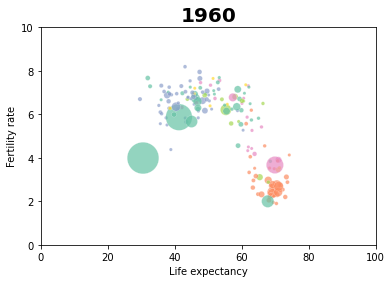

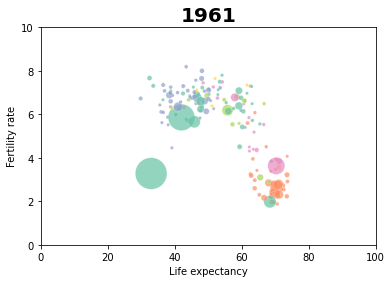

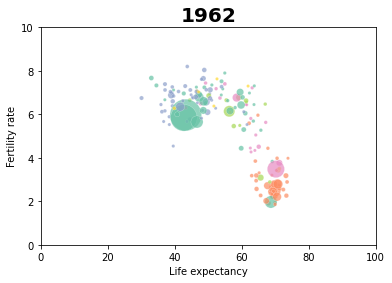

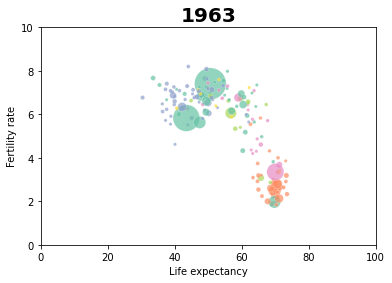

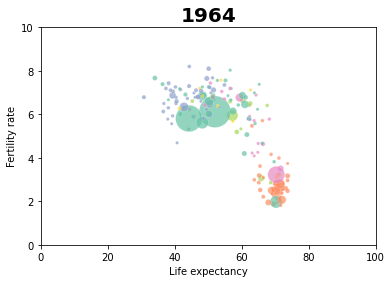

...

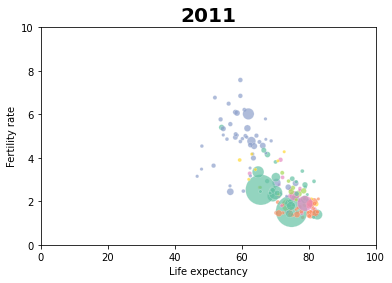

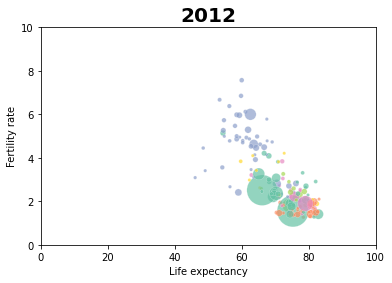

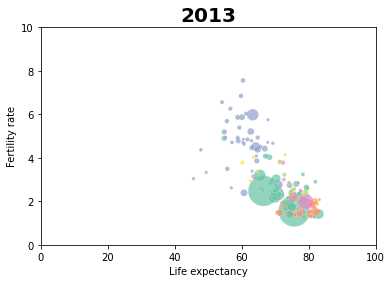

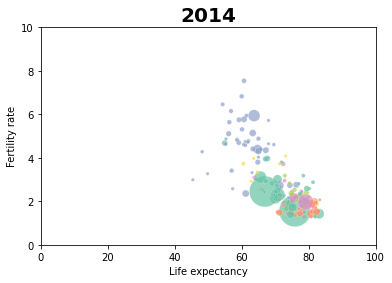

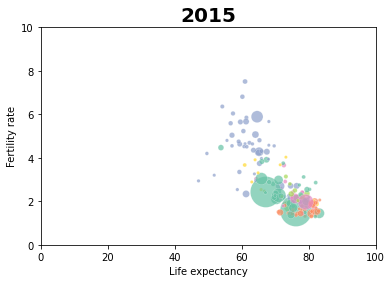

&lt;Figure size 432x288 with 0 Axes&gt;

In [27]:
images = []
folder='/home/lorena/Documents/bootcamp/W1/images'

if not os.path.exists(folder):
    os.mkdir(folder)

for year in range(1960, 2016):
    
    plt.axis((0, 100, 0, 10))
    
    sns.scatterplot(x='life_expectancy',
                    y='fertility_rate',
                    hue='continent',
                    size='population',
                    sizes=(10, 1000),
                    legend=False,
                    data=gapminder_df.loc[gapminder_df['year']==year],
                    alpha=0.7,
                    palette='Set2')
    
    plt.title(f'{year}', loc='center', fontsize=20, color='black', fontweight='bold')
    #plt.title(f'inspired by Hans Rosling', loc='right', fontsize=10, color='grey', style='italic', pad=-20)

    #plt.legend(bbox_to_anchor=(0.74, 0.85), loc='center')

    plt.xlabel('Life expectancy')
    plt.ylabel('Fertility rate')
    #plt.annotate({country}, )
    
    filename = f'lifeexp_{year}.png'
    
    plt.savefig(os.path.join(folder,filename))
    
    images.append(imageio.imread(os.path.join(folder,filename)))
    
    plt.figure()
    
imageio.mimsave(os.path.join(folder,'scatterplot.gif'), images, fps=20)

### Animated relplot

In [34]:
images = []
folder='/home/lorena/Documents/bootcamp/W1/images'

if not os.path.exists(folder):
    os.mkdir(folder)

for year in range(1960, 2015):
    
    plt.axis((0, 100, 0, 10))
    
    sns.relplot(
        x="life_expectancy",
        y="fertility_rate",
        legend=False,
        hue="country",
        size="population",
        sizes=(50, 1000),
        alpha=.5,
        palette="pastel",
        data=gapminder_df
        )
    
    plt.title(f'Year: {year}')

    plt.xlabel('Life expectancy')
    plt.ylabel('Fertility rate')
    #plt.annotate({country}, )
    
    filename = f'relplot_{year}.png'
    
    plt.savefig(os.path.join(folder,filename))
    
    images.append(imageio.imread(os.path.join(folder,filename)))
    
    plt.figure()
    
imageio.mimsave(os.path.join(folder,'relplot.gif'), images, fps=20)

KeyboardInterrupt: 

### Exploratory plots

&lt;AxesSubplot:xlabel=&#39;life_expectancy&#39;&gt;

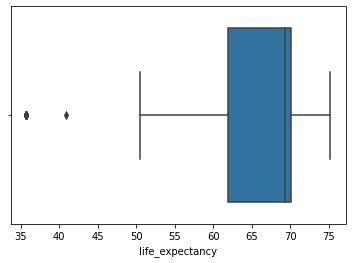

In [63]:
sns.boxplot(x=df_short["life_expectancy"])

&lt;seaborn.axisgrid.PairGrid at 0x7f1512797700&gt;

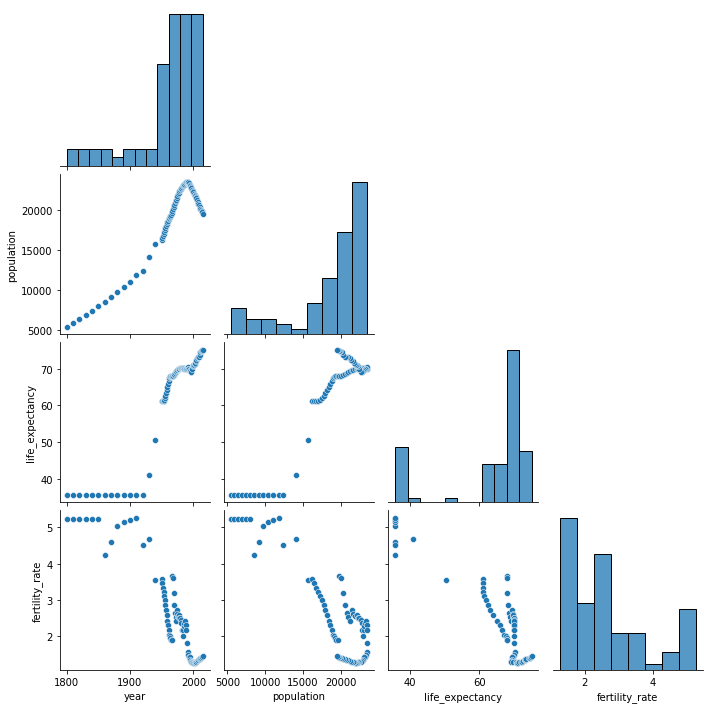

In [66]:
sns.pairplot(df_short, corner=True)

&lt;AxesSubplot:xlabel=&#39;life_expectancy&#39;, ylabel=&#39;fertility_rate&#39;&gt;

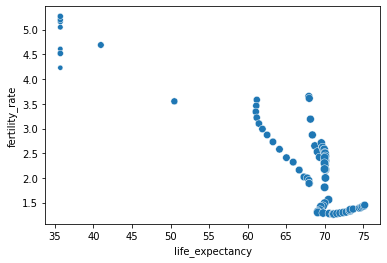

In [64]:
sns.scatterplot(data=df_short, x='life_expectancy', y='fertility_rate', size='population', legend=False)

&lt;AxesSubplot:xlabel=&#39;year&#39;, ylabel=&#39;population&#39;&gt;

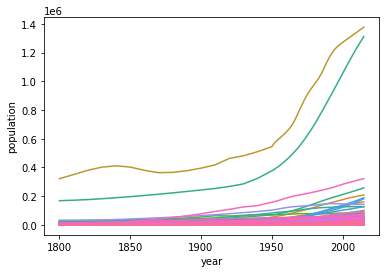

In [35]:
sns.lineplot(data=gapminder_df, x='year', y='population', hue='country', legend=False)

In [38]:
import matplotlib.pyplot as plt 
%matplotlib inline

In [81]:
df_idx = gapminder_df.set_index('year')
df_idx.head()

,country,population,life_expectancy,fertility_rate
year,,,,
1800,Afghanistan,3280.000,28.21,7.00
1800,Albania,410.445,35.40,4.60
1800,Algeria,2503.218,28.82,6.99
1800,Angola,1567.028,26.98,6.93
1800,Antigua and Barbuda,37.000,33.54,5.00


In [96]:
gapminder_idx = df_idx.stack()
gapminder_idx

year                 
1800  country            Afghanistan
      population            3.28e+06
      life_expectancy          28.21
      fertility_rate               7
      country                Albania
                            ...     
2015  fertility_rate            5.59
      country               Zimbabwe
      population         1.56028e+07
      life_expectancy           59.3
      fertility_rate            3.35
Length: 64920, dtype: object

In [103]:
years = gapminder_df['year'].unique()
years

array([1800, 1810, 1820, 1830, 1840, 1850, 1860, 1870, 1880, 1890, 1900,
       1910, 1920, 1930, 1940, 1950, 1951, 1952, 1953, 1954, 1955, 1956,
       1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967,
       1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978,
       1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989,
       1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015])